In [12]:
#import libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
import pandas as pd
import seaborn as sns
from sklearn import linear_model
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, PredictionErrorDisplay

In [2]:
#get location of current working directory
#cwd = os.getcwd()  
#files = os.listdir(cwd) 
#print("Files in %r: %s" % (cwd, files))

In [69]:
#get sample data
sample_file = "sample.csv"
sample_data = pd.read_csv(sample_file, sep=",")

In [46]:
#get test data
test_file = "test.csv"
test_data = pd.read_csv(test_file, sep=",")

In [47]:
#get training data
train_file = "train.csv"
train_data = pd.read_csv(train_file,sep=",")

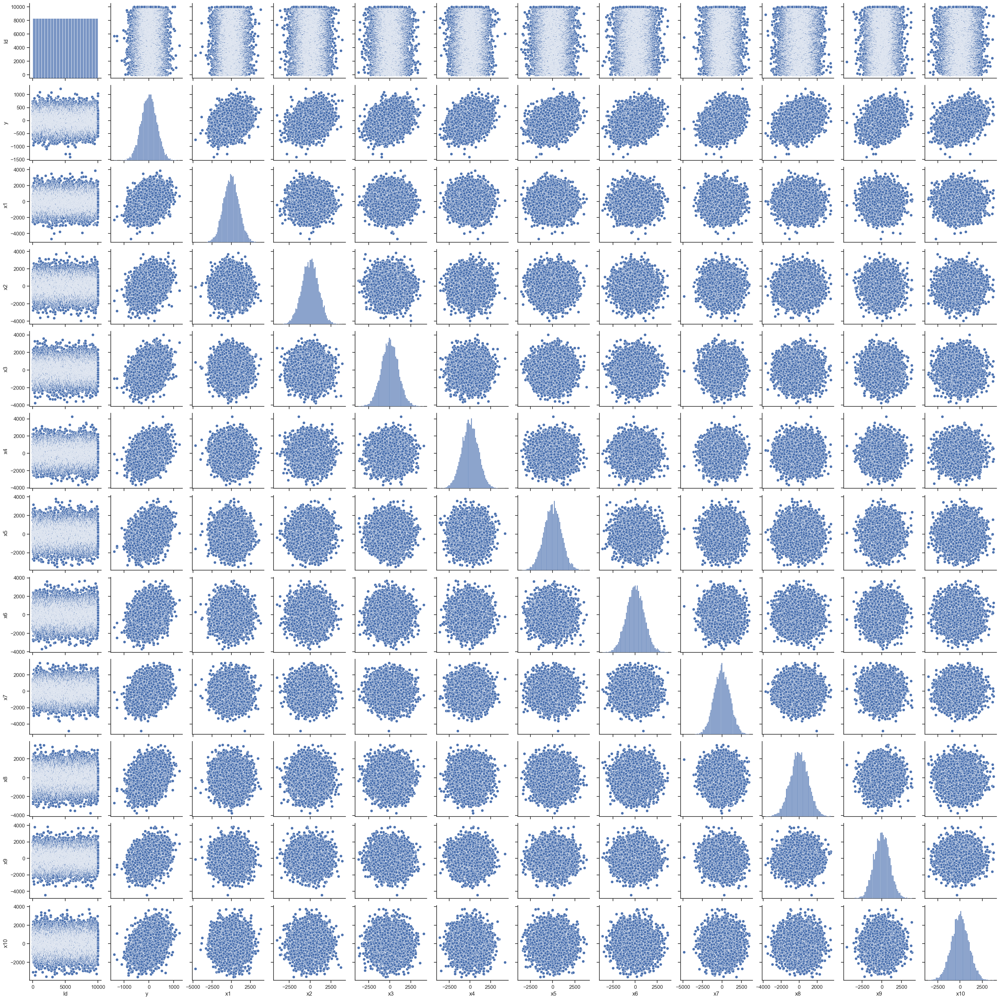

In [48]:
sns.pairplot(train_data)

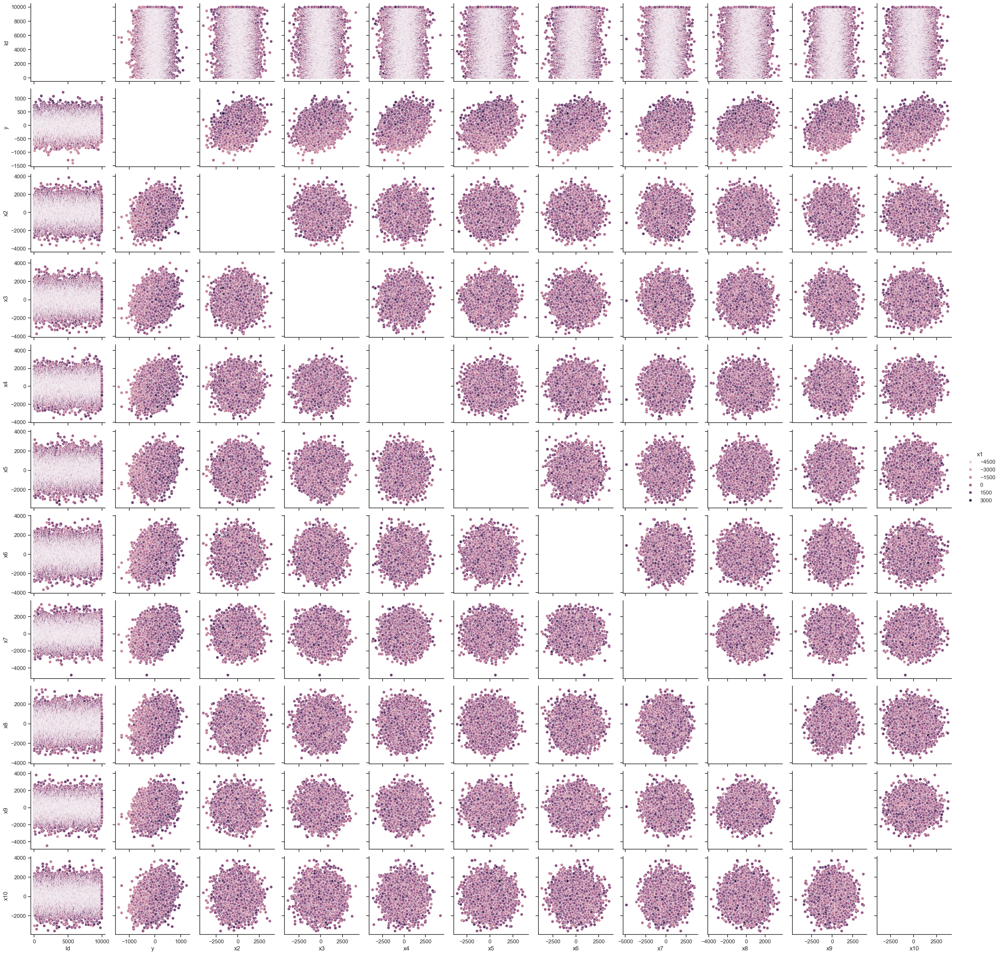

In [50]:
# a more informative plot
sns.set(style="ticks", color_codes=True)
sns.pairplot(train_data, hue='x1')

In [51]:
#initialize training data
x_train = train_data.drop(labels=['Id', 'y'], axis= 1)

In [52]:
#initialize training predictions
y_train = train_data['y']

In [53]:
print(x_train)

               x1           x2           x3           x4           x5  \
0     1764.052346   400.157208   978.737984  2240.893199  1867.557990   
1      144.043571  1454.273507   761.037725   121.675016   443.863233   
2    -2552.989816   653.618595   864.436199  -742.165020  2269.754624   
3      154.947426   378.162520  -887.785748 -1980.796468  -347.912149   
4    -1048.552965 -1420.017937 -1706.270191  1950.775395  -509.652182   
...           ...          ...          ...          ...          ...   
9995   -30.453041  1082.680684  -530.579767   602.366643 -2138.290628   
9996  2520.830358  -124.883939    18.067992  -998.622811 -1262.733524   
9997  -545.704959  1696.765630  -508.186053     3.620563 -1018.514516   
9998  -367.787118  -568.357801  -721.247794   198.279702  -217.422041   
9999   428.570549  -164.999054   864.962658  -647.662456   720.057730   

               x6           x7           x8           x9          x10  
0     -977.277880   950.088418  -151.357208  -103.2

In [54]:
print(y_train)

0       738.023171
1       400.646015
2       189.900156
3       -78.399449
4      -547.373531
           ...    
9995   -199.976500
9996     39.584572
9997     61.176538
9998   -202.136489
9999   -289.218996
Name: y, Length: 10000, dtype: float64


In [55]:
#litting the Dataset
#x_train, x_test, y_train, y_test = model_selection.train_test_split(x, y, test_size= 1, random_state= 101)
#print(y_test)

In [73]:
#Initialize test data and predictions
x_test = test_data.drop(labels=['Id'], axis= 1)


In [74]:
# Instantiating LinearRegression() Model
lr = linear_model.LinearRegression()

In [75]:
# Training/Fitting the Model
lr.fit(x_train, y_train)

LinearRegression()

In [91]:
# Making Predictions
lr.predict(x_test)
pred = lr.predict(x_test)
print(pred)

#convert predictions to dataframe
pred_df = pd.DataFrame(pred, columns=["y"]) 

#write predictions to file
pred_file = "pred.csv"
pred_df.to_csv(pred_file, index=True, sep=",")


[ -66.00242349  451.4065044  -461.67641706 ...  -35.13540942 -131.67918453
  417.26915462]


In [77]:
# The coefficients
print("Coefficients: \n", lr.coef_)

Coefficients: 
 [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [78]:
#initialize results
y_test = sample_data['y']


In [92]:
# The coefficients
print("Coefficients: \n", lr.coef_)
# Evaluating Model's Performance
print('Mean Absolute Error:', mean_absolute_error(y_test, pred))
print('Mean Squared Error:', mean_squared_error(y_test, pred))
print('Mean Root Squared Error:', np.sqrt(mean_squared_error(y_test, pred)))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, pred))

Coefficients: 
 [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Mean Absolute Error: 1018.0252483872739
Mean Squared Error: 1416235.9130199903
Mean Root Squared Error: 1190.057104940763
Coefficient of determination: -3.25


In [80]:
print(x_test)

               x1           x2           x3           x4           x5  \
0     -483.797492  1288.057065  -129.878712  -198.078388  -334.487592   
1     -316.407305    30.830556  -313.356726  -173.259184  -327.368719   
2    -2448.558997  -561.988408   355.098820   634.378170  -392.450091   
3     -942.120025   945.373015   140.910705  1753.565841  -347.223685   
4     1752.366157  -597.550816  -466.491398 -1094.792276  -645.424882   
...           ...          ...          ...          ...          ...   
1995   -70.207810   328.849423  1006.084617   440.948562  -692.274282   
1996 -1692.417164   968.971133  1371.423442  -144.224724   503.164492   
1997   199.864648   261.345779  -127.986805  -298.503216  -364.240174   
1998  -151.673157 -1425.199620  1070.922114   938.800763  1373.176372   
1999   -97.089983   780.444250   221.081520    72.748763 -1484.861623   

               x6           x7           x8           x9          x10  
0     -391.443186  -612.406176  -676.523964  1327.2

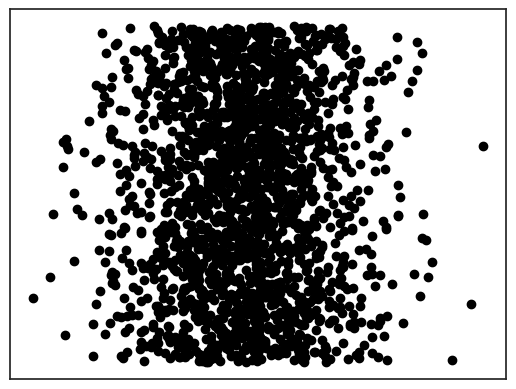

In [85]:
# Plot outputs
plt.scatter(x_test['x2'], y_test, color="black")
#plt.plot(X_test['sepal_width'], pred, color="blue", linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

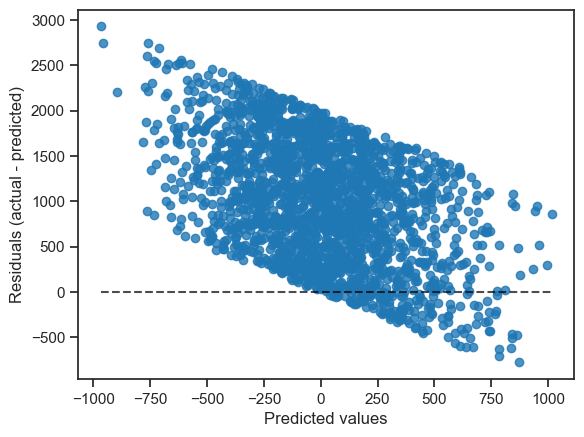

In [86]:
display = PredictionErrorDisplay(y_true=y_test, y_pred=pred)
display.plot()